# LINMA2472:  Homework 4
## SIR epidemiology model over networks

In [1]:
# imports, note scipy>=1.8 is needed
import numpy as np
import random
import networkx as nx
from IPython.display import Image
import matplotlib.pyplot as plt
import collections
from matplotlib.ticker import MaxNLocator
import statistics as stats
from collections import Counter
import seaborn as sns
from matplotlib import rc
import pandas as pd
import csv
import sklearn.cluster
import scipy
import plotly
import plotly.graph_objs as go
import random
import copy
import sklearn #pip install scikit-learn
import plotly.io as pio
import plotly.express as px
from community import community_louvain #pip install python-louvain
import plotly
import plotly.graph_objs as go
import time
import seaborn as sns
import matplotlib.cm as cm

#from igraph import *
pio.renderers.default = "notebook"
print("done")

done


## 1. Text traitement

In [2]:
book = []
with open('iliad.txt', "r", encoding="utf8" ) as input_f:  #if error: erase encoding="utf8"
    book = input_f.read()
    book = book.lower()
    book = list(filter(lambda x : x != '', book.split('\n\n')))
    
characters = []
with open('iliad_characters.txt', 'r') as char:
    characters = char.read()
    characters = list(filter(lambda x : x != '', characters.split('\n')))

list_to_delete = ['come', 'dear', 'first', 'go', 'may', 'nay', 'mt', 'o', 'son', 'sir', 'sleep',
                  'stand', 'thus', "king", "achaean", "trojan", "trojans","o","argives","ilius",
                  "troy", "danaan"]
#if character is in list_to_delete, delete it
for character in characters[:]:
    if character in list_to_delete:
        characters.remove(character)




#export New characters in txt file one character per line
with open('characters.txt', 'w') as f:
    for item in characters:
        f.write("%s \n" % item)
        


In [3]:
characters

['hector',
 'jove',
 'achilles',
 'priam',
 'ajax',
 'agamemnon',
 'patroclus',
 'menelaus',
 'atreus',
 'minerva',
 'peleus',
 'juno',
 'mars',
 'apollo',
 'tydeus',
 'nestor',
 'olympus',
 'aeneas',
 'diomed',
 'saturn',
 'idomeneus',
 'neptune',
 'antilochus',
 'sarpedon',
 'hades',
 'telamon',
 'ida',
 'alexandrus',
 'helen',
 'ulysses',
 'iris',
 'meriones',
 'thetis',
 'teucer',
 'phoebus apollo',
 'menoetius',
 'vulcan',
 'ajaxes',
 'polydamas',
 'king agamemnon',
 'argos',
 'venus',
 'antenor',
 'glaucus',
 'deiphobus',
 'pallas minerva',
 'oileus',
 'lycaon',
 'automedon',
 'father jove',
 'mercury',
 'aeacus',
 'lycia',
 'oceanus',
 'paris',
 'idaeus',
 'phthia',
 'myrmidons',
 'neleus',
 'alas',
 'gerene',
 'asius',
 'xanthus',
 'dardanus',
 'agenor',
 'diana',
 'forthwith',
 'thoas',
 'hercules',
 'eurypylus',
 'machaon',
 'panthous',
 'phoenix',
 'briseis',
 'bellerophon',
 'leto',
 'argus',
 'scamander',
 'thebes',
 'scaean',
 'laomedon',
 'asteropaeus',
 'phyleus',
 'aca

In [4]:
#add 1 if a specific personnage is in a specific page
occurence_page = pd.DataFrame(0,columns=characters, index=(i for i in range(len(book))))
for i in range(len(book)):
    for personnage in characters:
        if personnage in book[i]:
            occurence_page.loc[[i], [personnage]] += 1
            

In [5]:
#create the confusion matrix by dot product
occurence = occurence_page.T.dot(occurence_page)
#fill diagonal with 0
np.fill_diagonal(occurence.values, 0)


In [6]:
#drop all rows filled with zeros i.e. characters (from csv data file) having no interactions
occurence = occurence.loc[(occurence != 0).any(axis=1)]
for i in occurence.columns:
    if i not in occurence.index:
        occurence.drop(i, axis=1, inplace=True)
occurence.to_csv('./occurence.csv')
occurence.head()

,hector,jove,achilles,priam,ajax,agamemnon,patroclus,menelaus,atreus,minerva,...,melanippus,cebriones,euphorbus,pirithous,nine,peteos,mycenae,elis,meleager,antiphus
hector,0,109,83,77,59,27,50,24,18,31,...,2,7,4,0,7,1,1,0,0,1
jove,109,0,71,50,34,54,26,24,43,63,...,1,1,2,4,8,1,2,1,1,0
achilles,83,71,0,54,25,47,68,12,37,25,...,0,1,4,1,9,0,0,2,0,2
priam,77,50,54,0,17,19,9,14,11,20,...,1,3,1,1,8,0,1,0,0,2
ajax,59,34,25,17,0,18,19,22,16,4,...,2,3,1,0,1,3,0,0,0,1


## 2. Networks study

méga bonne ressources pour l'analyse de network : https://cambridge-intelligence.com/keylines-faqs-social-network-analysis/

In [7]:
#Here we need to set the nodes and edges of the graph to create it

#list of all characters appearing in the text to set the nodes of the graph
nod=[]
for i in occurence.index:
    nod.append(str(i).strip("/(),'"))

#set the edges of the graph
edg=[]
for i in range(len(occurence)):
    for j in range(len(occurence)):
        if occurence.iloc[i,j] != 0:
            edg.append( (str(occurence.index[i]).strip("/(),'"),
                         str(occurence.index[j]).strip("/(),'"),
                        occurence.iloc[i,j]) )

In [8]:
print(edg[3])
print(nod)

('hector', 'ajax', 59)
['hector', 'jove', 'achilles', 'priam', 'ajax', 'agamemnon', 'patroclus', 'menelaus', 'atreus', 'minerva', 'peleus', 'juno', 'mars', 'apollo', 'tydeus', 'nestor', 'olympus', 'aeneas', 'diomed', 'saturn', 'idomeneus', 'neptune', 'antilochus', 'sarpedon', 'hades', 'telamon', 'ida', 'alexandrus', 'helen', 'ulysses', 'iris', 'meriones', 'thetis', 'teucer', 'phoebus apollo', 'menoetius', 'vulcan', 'ajaxes', 'polydamas', 'king agamemnon', 'argos', 'venus', 'antenor', 'glaucus', 'deiphobus', 'pallas minerva', 'oileus', 'lycaon', 'automedon', 'father jove', 'mercury', 'aeacus', 'lycia', 'oceanus', 'paris', 'idaeus', 'phthia', 'myrmidons', 'neleus', 'alas', 'gerene', 'asius', 'xanthus', 'dardanus', 'agenor', 'diana', 'forthwith', 'thoas', 'hercules', 'eurypylus', 'machaon', 'panthous', 'phoenix', 'briseis', 'bellerophon', 'leto', 'argus', 'scamander', 'thebes', 'scaean', 'laomedon', 'asteropaeus', 'phyleus', 'acamas', 'dolon', 'pylos', 'lemnos', 'king priam', 'tlepolemus'

### 2.1 Simple spring network
#### 2.1.1 Network characteristics 

In [9]:
# create graph and get nodes and edges
G=nx.Graph()
G.add_nodes_from(nod)
G.add_weighted_edges_from(edg)
weight=nx.get_edge_attributes(G,'weight')

The average degree of a node is 45.431


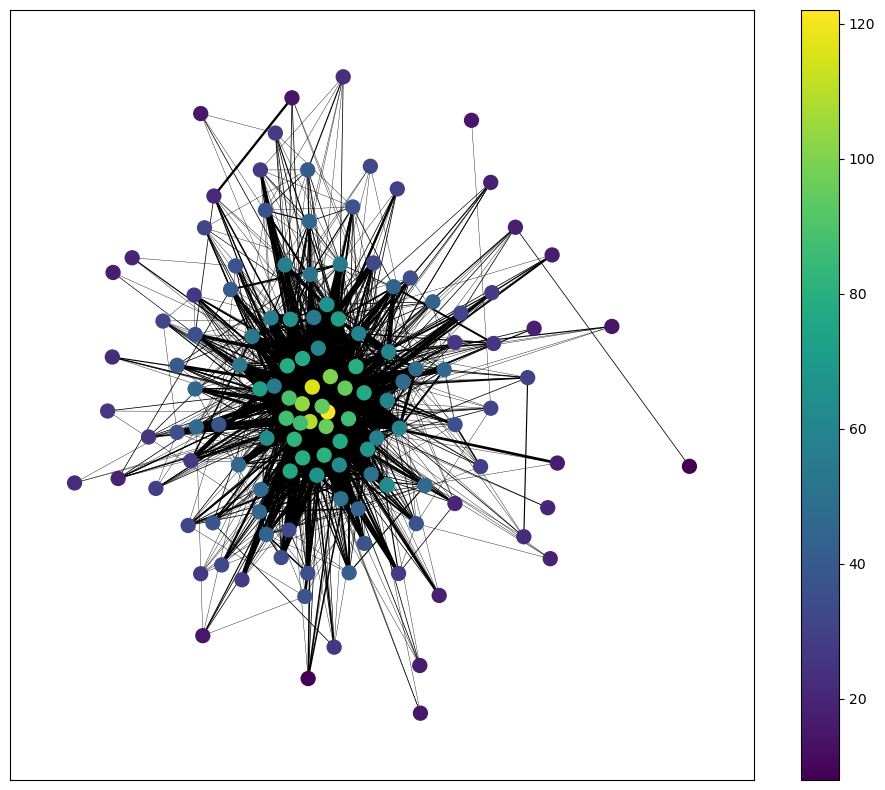

In [10]:
# Basic network using spring layout
# Gradient color correspond to nodes degree
plt.figure(figsize=(12,10))
pos_spring = nx.spring_layout(G, seed=4, k=.5)
deg = [val for (node, val) in G.degree()]

weight_of_edges = list(nx.get_edge_attributes(G, "weight").values())
print('The average degree of a node is '+ str(round(np.mean(deg),3)))
norm_weight = (np.array(weight_of_edges)-min(weight_of_edges))/(max(weight_of_edges)-min(weight_of_edges))

node = nx.draw_networkx_nodes(G, pos=pos_spring, node_size=100, cmap='viridis', node_color=deg)
nx.draw_networkx_edges(G, pos=pos_spring, alpha=1, width=norm_weight*30, edge_color='black')
plt.colorbar(node)
#plt.title('Coloring based on nodes degree')
plt.savefig('./images/basic_spring_network.png', dpi=500)
#plt.savefig('./images/basic_spring_network.svg', format='svg')
plt.show()

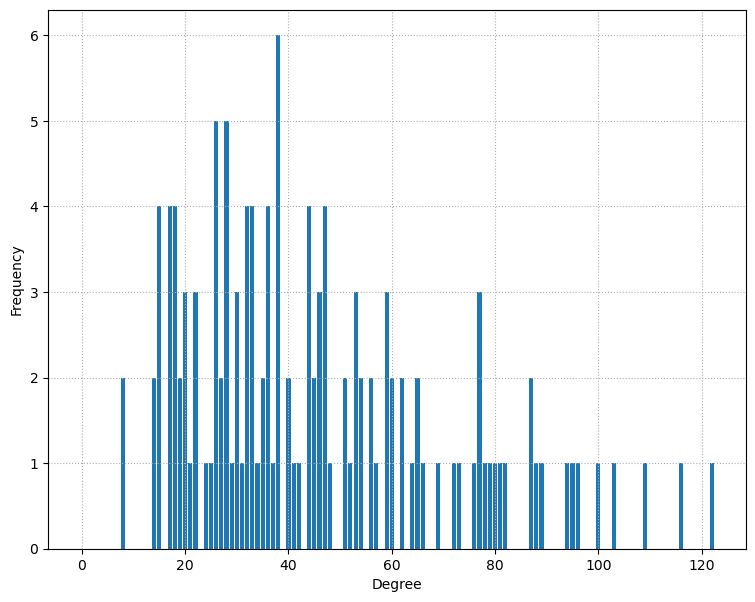

In [11]:
# degree distribution vizualisation
degree_freq = nx.degree_histogram(G)
degrees = range(len(degree_freq))
plt.figure(figsize=(9, 7))
plt.bar(degrees, degree_freq)
plt.grid(linestyle=':')
plt.xlabel('Degree')
plt.ylabel('Frequency')

plt.savefig('./degree_distribution.png', dpi=300)
plt.show()

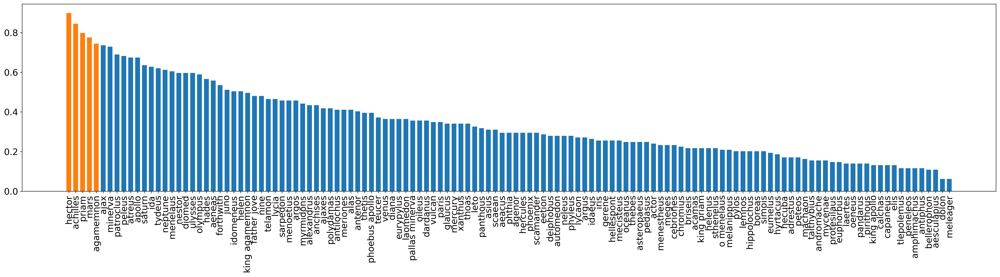

In [12]:
# degree centrality
# = Degree centrality assigns an importance score based simply on the number of links held by each node
# => How many direct, ‘one hop’ connections each node has to other nodes in the network.

degree_centrality = nx.degree_centrality(G)
sorted_degree_centrality =  sorted(degree_centrality.items(), key=lambda x:x[1], reverse=True)

plt.figure(figsize=(25,7), dpi=300)
for i in range(1,len(sorted_degree_centrality)):
    plt.bar(sorted_degree_centrality[i][0], sorted_degree_centrality[i][1], 
            color='tab:orange' if i<=5 else 'tab:blue',
            width=0.7)
plt.xticks(rotation=90, fontsize=16)
plt.yticks(fontsize=16)

plt.tight_layout()
plt.savefig('images/degree_centrality.png', dpi=500)
#plt.savefig('images/degree_centrality.svg', format='svg', dpi=500)
plt.show()

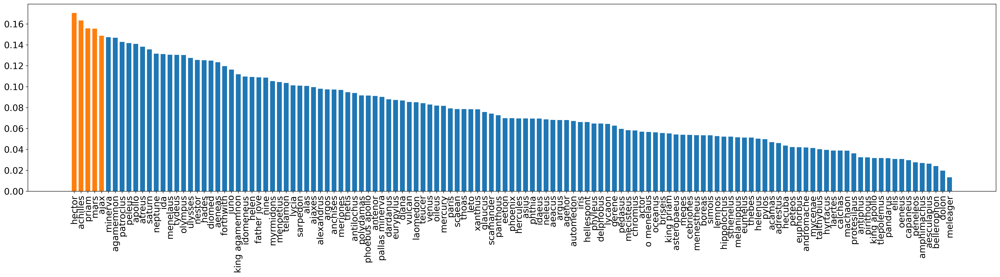

In [13]:
#eigen centrality 
# = EigenCentrality measures a node’s influence based on the number of links it has to other nodes in the network. 
# EigenCentrality then goes a step further by also taking into account how well connected a node is, and how many links their connections have, and so on through the network.
#By calculating the extended connections of a node, EigenCentrality can identify nodes with influence over the whole network, not just those directly connected to it.

eigen_centrality = nx.eigenvector_centrality(G)
sorted_eigen_centrality =  sorted(eigen_centrality.items(), key=lambda x:x[1], reverse=True)

plt.figure(figsize=(25,7), dpi=300)
for i in range(1,len(sorted_eigen_centrality)):
    plt.bar(sorted_eigen_centrality[i][0], sorted_eigen_centrality[i][1], 
            color='tab:orange' if i<=5 else 'tab:blue',
            width=0.7)
plt.xticks(rotation=90, fontsize=16)
plt.yticks(fontsize=16)

plt.tight_layout()
plt.savefig('images/eigen_centrality.png', dpi=500)
#plt.savefig('images/eigen_centrality.svg', format='svg', dpi=500)
plt.show()

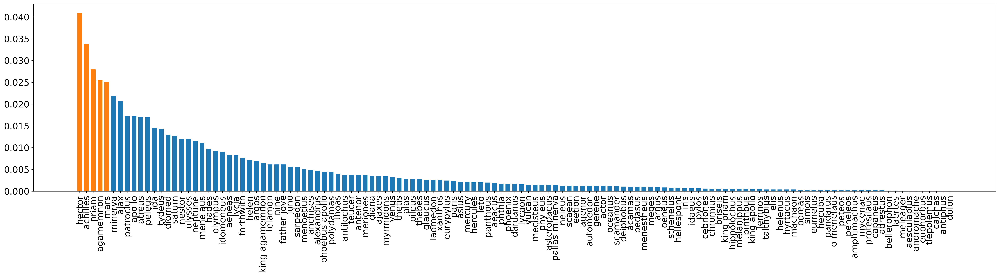

In [14]:
# betweenness centrality
# = For finding the individuals who influence the flow around a system.
#This measure shows which nodes are ‘bridges’ between nodes in a network 

between_centrality = nx.betweenness_centrality(G)
sorted_between_centrality =  sorted(between_centrality.items(), key=lambda x:x[1], reverse=True)

plt.figure(figsize=(25,7), dpi=300)
for i in range(1,len(sorted_between_centrality)):
    plt.bar(sorted_between_centrality[i][0], sorted_between_centrality[i][1], 
            color='tab:orange' if i<=5 else 'tab:blue',
            width=0.7)
plt.xticks(rotation=90, fontsize=16)
plt.yticks(fontsize=16)

plt.tight_layout()
plt.savefig('images/between_centrality.png', dpi=500)
#plt.savefig('images/between_centrality.svg', format='svg')
plt.show()

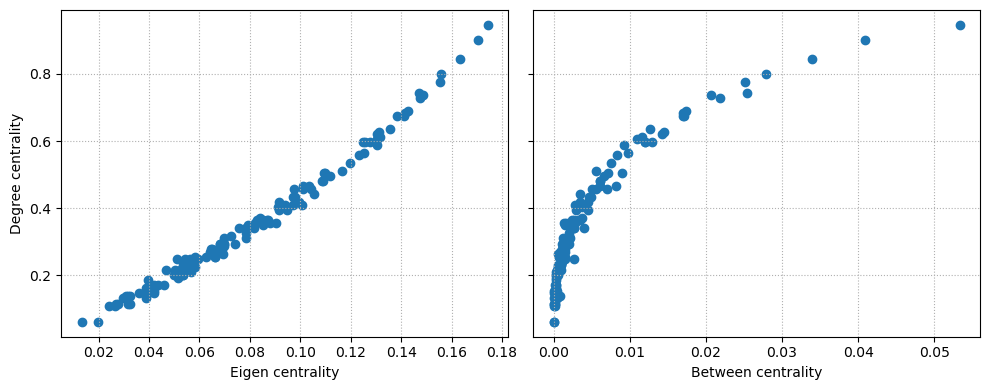

In [15]:
# relationship between degree centrality and eigencen/betweenness centrality

fig, ax = plt.subplots(1,2, figsize=(10,4), sharey=True)
ax[0].scatter(eigen_centrality.values(), degree_centrality.values())
ax[0].set_xlabel('Eigen centrality')
ax[0].set_ylabel('Degree centrality')
ax[0].grid(linestyle=':')

ax[1].scatter(between_centrality.values(), degree_centrality.values())
ax[1].set_xlabel('Between centrality')
ax[1].grid(linestyle=':')

plt.tight_layout()
plt.savefig('images/centrality_measures_relationships.png', dpi=500)
#plt.savefig('images/centrality_measures_relationships.svg', format='svg')
plt.show()

#### 2.1.2 Detecting communities

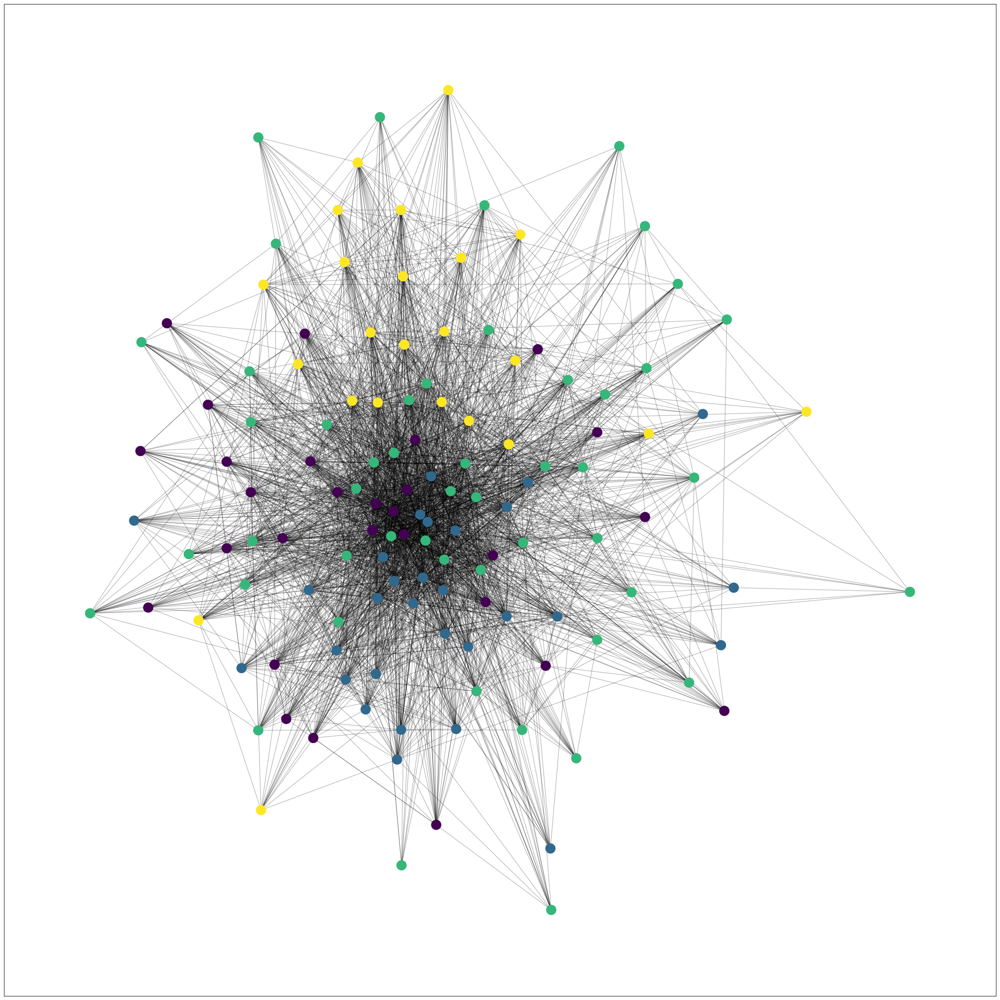

In [16]:
# community detection with louvain algorithm
louvain_partition = community_louvain.best_partition(G)
node_colors = list(louvain_partition.values())


plt.figure(figsize=(25,25))
cmap = cm.get_cmap('viridis', max(louvain_partition.values()) + 1)
nx.draw_networkx_nodes(G, pos_spring, louvain_partition.keys(),
                       node_color=node_colors,
                       cmap=cmap)
nx.draw_networkx_edges(G, pos=pos_spring, alpha=0.3)

plt.tight_layout()
plt.savefig('images/communities_spring.png', dpi=500)
#plt.savefig('images/communities_spring.svg', format='svg')
plt.show()


### 2.1.3 SIR model over network

no display found. Using non-interactive Agg backend
no display found. Using non-interactive Agg backend


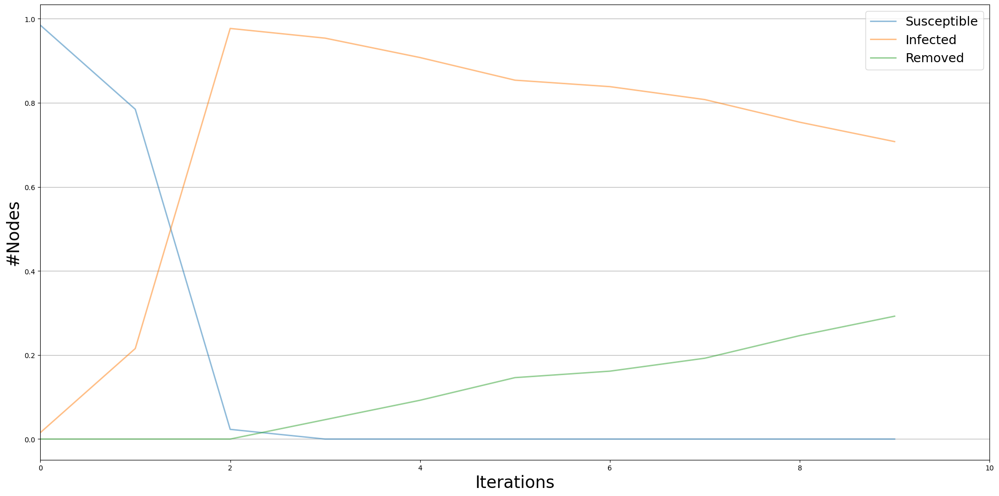

In [17]:
import networkx as nx
import matplotlib.pyplot as plt
import dynetx as dn
import ndlib.models.ModelConfig as mc
import ndlib.models.dynamic as dm
from past.builtins import xrange
import ndlib.models.epidemics as ep
from ndlib.utils import multi_runs
from ndlib.viz.mpl.DiffusionTrend import DiffusionTrend
from ndlib.viz.mpl.TrendComparison import DiffusionTrendComparison
import warnings
from bokeh.io import output_notebook, show
warnings.filterwarnings("ignore")
%matplotlib inline

# Network topology
g = G               # 1000 nodes with 10% probability of edge creation

# Model selection
model  = ep.SIRModel(g)

# Model Configuration
cfg = mc.Configuration()
cfg.add_model_parameter('beta', 0.5)                   # Infection probability     S -> I #('beta', 0.02)
cfg.add_model_parameter('gamma', 0.05)                 # Removal probability       I -> R #('gamma', 0.005)
cfg.add_model_parameter("fraction_infected", 0.02)      # 50 infected nodes at start in the network 
model.set_initial_status(cfg)

# Simulation execution
iterations = model.iteration_bunch(10)
trends = model.build_trends(iterations)

# Show simulation
viz = DiffusionTrend(model, trends)
p=viz.plot()
#show(p)


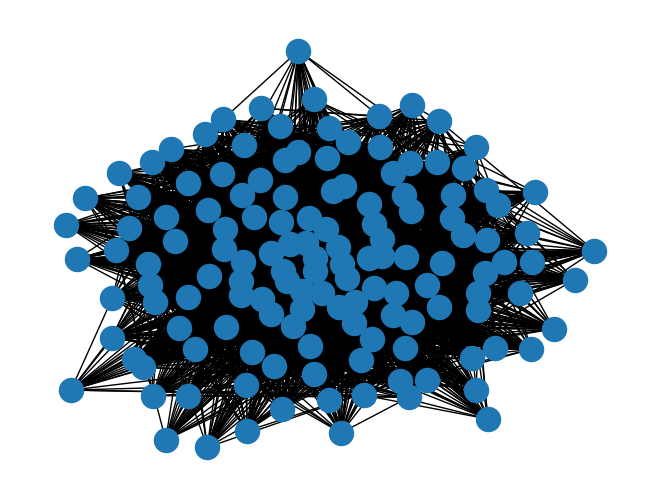

In [18]:
degree = [degI for (name, degI) in G.degree()]
barabasiAlbert = nx.barabasi_albert_graph(138, int(np.mean(degree)))
nx.draw(barabasiAlbert)

# SIR model

In [19]:
#link of the git : https://colab.research.google.com/github/KDDComplexNetworkAnalysis/CNA_Tutorials/blob/master/NDlib.ipynb#scrollTo=JZ1O1oPGPXfX
import ndlib.models.epidemics as ep
import ndlib.models.ModelConfig as mc

model = ep.SIRModel(G)

model.available_statuses



cfg = mc.Configuration()
cfg.add_model_parameter('beta', 0.001) # infection rate
cfg.add_model_parameter('gamma', 0.01) # recovery rate


percentage_infected = (100/len(nod))/100
cfg.add_model_parameter("percentage_infected", percentage_infected) #percentage_infected corresponds to the percentage of infected nodes at the beginning of the similation here it is 0.7% which is one nod
model.set_initial_status(cfg)


#set the number of iteration
iterations = model.iteration_bunch(1000, node_status=True)
trends = model.build_trends(iterations)

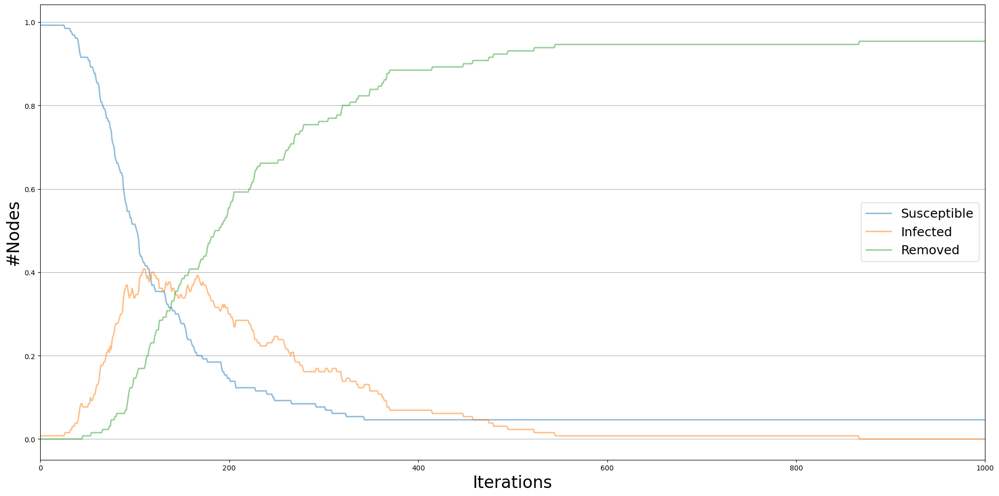

In [20]:
%matplotlib inline
from ndlib.viz.mpl.DiffusionTrend import DiffusionTrend
viz = DiffusionTrend(model, trends)
viz.plot()

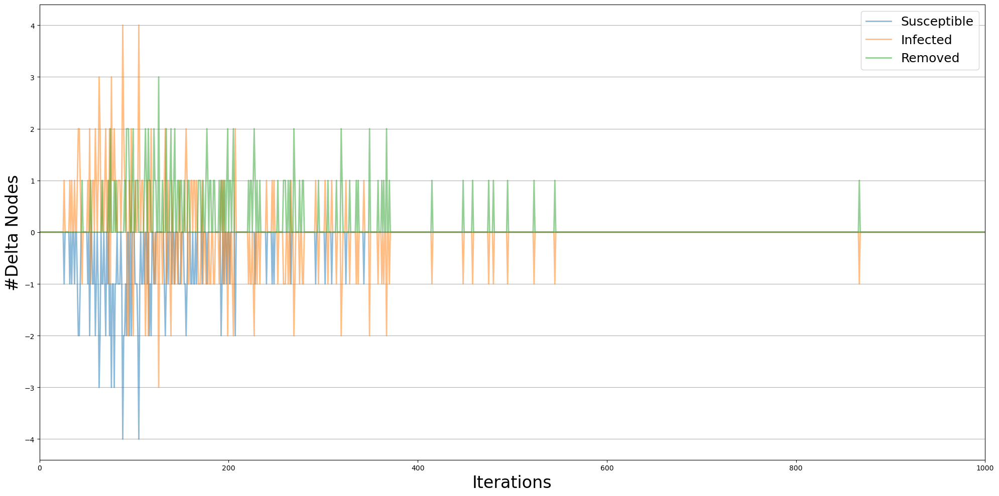

In [21]:
from ndlib.viz.mpl.DiffusionPrevalence import DiffusionPrevalence
viz = DiffusionPrevalence(model, trends)
viz.plot()

# Source code Gillespie_SIR
As been changed to avoid errors

In [22]:
# from EoN.simulation import _ListDict_
# from collections import defaultdict
# def _transform_to_node_history_(infection_times, recovery_times, tmin, SIR = True):
#     r'''The original (v0.96 and earlier) returned infection_times and recovery_times.
#     The new version returns node_history instead. This code transforms
#     the former to the latter.
    
#     It is only used for the continuous time cases.
#     '''
#     if SIR:
#         node_history = defaultdict(lambda : ([tmin], ['S']))
#         for node, time in infection_times.items():
#             if time == tmin:
#                 node_history[node] = ([], [])
#             node_history[node][0].append(time)
#             node_history[node][1].append('I')
#         for node, time in recovery_times.items():
#             if time == tmin:
#                 node_history[node] = ([], [])
#             node_history[node][0].append(time)
#             node_history[node][1].append('R')        
#     else:
#         node_history = defaultdict(lambda : ([tmin], ['S']))
#         for node, Itimes in infection_times.items():
#             Rtimes = recovery_times[node]
#             while Itimes:
#                 time = Itimes.pop(0)
#                 if time == tmin:
#                     node_history[node] = ([], [])
#                 node_history[node][0].append(time)
#                 node_history[node][1].append('I')
#                 if Rtimes:
#                     time = Rtimes.pop(0)
#                     node_history[node][0].append(time)
#                     node_history[node][1].append('S')
        
#     return node_history


# def Gillespie_SIR(G, tau, gamma, initial_infecteds=None, 
#                     initial_recovereds = None, rho = None, tmin = 0, 
#                     tmax=float('Inf'), recovery_weight = None, 
#                     transmission_weight = None, return_full_data = False, sim_kwargs = None):
#     #tested in test_SIR_dynamics
#     r'''    
    
#     Performs SIR simulations for epidemics.
    
#     For unweighted networks, the run time is usually slower than fast_SIR, but 
#     they are close.  If we add weights, then this Gillespie implementation 
#     slows down much more.  
    
#     I think there are better ways to implement the algorithm to remove this.  
#     This will need a new data type that allows us to quickly sample a random 
#     event with appropriate weight.  I think this is doable through a binary 
#     tree and it is in development.
    
#     Rather than using figure A.1 of Kiss, Miller, & Simon, this uses a method 
#     from Petter Holme 
#         "Model versions and fast algorithms for network epidemiology"
#     which focuses on SI edges (versions before 0.99.2 used a
#     method more like fig A.1).  
    
            
#     This approach will not work for nonMarkovian transmission.  Boguna et al
#         "Simulating non-Markovian stochastic processes"
#     have looked at how to handle nonMarkovian transmission in a Gillespie 
#     Algorithm.  At present I don't see a way to efficientl adapt their 
#     approach - I think each substep will take O(N) time.  So the full algorithm 
#     will be O(N^2).  For this, it will be much better to use fast_SIR
#     which I believe is O(N log N)
    
#     :See Also:

#     **fast_SIR** which has the same inputs but uses a different method to 
#     run faster, particularly in the weighted case.
    
#     :Arguments:
         
#     **G** networkx Graph
#         The underlying network
#     **tau** positive float
#         transmission rate per edge
       
#     **gamma** number
#         recovery rate per node
    
#     **initial_infecteds** node or iterable of nodes
#         if a single node, then this node is initially infected
#         if an iterable, then whole set is initially infected
#         if None, then choose randomly based on rho.  If rho is also
#         None, a random single node is chosen.
#         If both initial_infecteds and rho are assigned, then there
#         is an error.
    
#     **initial_recovereds** iterable of nodes (default None)
#         this whole collection is made recovered.
#         Currently there is no test for consistency with initial_infecteds.
#         Understood that everyone who isn't infected or recovered initially
#         is initially susceptible.
        
#     **rho** number
#         initial fraction infected. number is int(round(G.order()*rho))
        
#     **tmin** number (default 0)
#         starting time
            
#     **tmax** number (default Infinity)
#         stop time
        
#     **recovery_weight** string (default None)
#         the string used to define the node attribute for the weight.
#         Assumes that the recovery rate is gamma*G.nodes[u][recovery_weight].
#         If None, then just uses gamma without scaling.
    
#     **transmission_weight** string (default None)
#         the string used to define the edge attribute for the weight.
#         Assumes that the transmission rate from u to v is 
#         tau*G.adj[u][v][transmission_weight]
#         If None, then just uses tau without scaling.

#     **return_full_data** boolean (default False)
#         Tells whether a Simulation_Investigation object should be returned.  

#     **sim_kwargs** keyword arguments
#         Any keyword arguments to be sent to the Simulation_Investigation object
#         Only relevant if ``return_full_data=True``


#     :Returns: 
        
#     **times, S, I, R** each a numpy array
#         giving times and number in each status for corresponding time

#     OR if return_full_data=True:
    
#     **full_data**  Simulation_Investigation object
#         from this we can extract the status history of all nodes
#         We can also plot the network at given times
#         and even create animations using class methods.
        
#     :SAMPLE USE:


#     ::

#         import networkx as nx
#         import EoN
#         import matplotlib.pyplot as plt
        
#         G = nx.configuration_model([1,5,10]*100000)
#         initial_size = 10000
#         gamma = 1.
#         tau = 0.3
#         t, S, I, R = EoN.Gillespie_SIR(G, tau, gamma, 
#                                     initial_infecteds = range(initial_size))
                                    
#         plt.plot(t, I)
    
#     '''

#     if rho is not None and initial_infecteds is not None:
#         raise EoN.EoNError("cannot define both initial_infecteds and rho")

    
#     if return_full_data:
#         infection_times = defaultdict(lambda: []) #defaults to an empty list for each node
#         recovery_times = defaultdict(lambda: [])

#     if transmission_weight is not None:
#         def edgeweight(u,v):
#             return G.adj[u][v][transmission_weight]
#     else:
#         def edgeweight(u,v):
#             return None
    
#     if recovery_weight is not None:
#         def nodeweight(u):
#             return G.nodes[u][recovery_weight]
#     else:
#         def nodeweight(u):
#             return None

#     tau = float(tau)  #just to avoid integer division problems in python 2.
#     gamma = float(gamma)
    
#     if initial_infecteds is None:
#         if rho is None:
#             initial_number = 1
#         else:
#             initial_number = int(round(G.order()*rho))
#         initial_infecteds=random.sample(list(G.nodes()), initial_number)
#     elif G.has_node(initial_infecteds):
#         initial_infecteds=[initial_infecteds]
        
#     if initial_recovereds is None:
#         initial_recovereds = []
        
#     I = [len(initial_infecteds)]
#     R = [len(initial_recovereds)]
#     S = [G.order()-I[0]-R[0]]
#     times = [tmin]
    
#     transmissions = []
#     t = tmin
    
#     status = defaultdict(lambda : 'S')
#     for node in initial_infecteds:
#         status[node] = 'I'
#         if return_full_data:
#             infection_times[node].append(t)
#             transmissions.append((t, None, node))
#     for node in initial_recovereds:
#         status[node] = 'R'
#         if return_full_data:
#             recovery_times[node].append(t)

#     if recovery_weight is not None:
#         infecteds = _ListDict_(weighted=True)
#     else:
#         infecteds = _ListDict_() #unweighted - code is faster for this case
#     if transmission_weight is not None:
#         IS_links = _ListDict_(weighted=True)
#     else:
#         IS_links = _ListDict_()

#     for node in initial_infecteds:
#         infecteds.update(node, weight_increment = nodeweight(node)) #weight is none if unweighted
#         for nbr in G.neighbors(node):  #must have this in a separate loop 
#                                        #from assigning status
#             if status[nbr] == 'S':
#                 IS_links.update((node, nbr), weight_increment = edgeweight(node,nbr))
    
#     total_recovery_rate = gamma*infecteds.total_weight() #gamma*I_weight_sum
    
#     total_transmission_rate = tau*IS_links.total_weight()#IS_weight_sum
        
#     total_rate = total_recovery_rate + total_transmission_rate
#     delay = random.expovariate(total_rate)
#     t += delay
    
#     while infecteds and t<tmax:
#         if random.random()<total_recovery_rate/total_rate: #recover
#             recovering_node = infecteds.random_removal() #does weighted choice and removes it
#             status[recovering_node]='R'
#             if return_full_data:
#                 recovery_times[recovering_node].append(t)

#             for nbr in G.neighbors(recovering_node):
#                 if status[nbr] == 'S':
#                     IS_links.remove((recovering_node, nbr))
#             times.append(t)
#             S.append(S[-1])
#             I.append(I[-1]-1)
#             R.append(R[-1]+1)
#         else: #transmit
#             transmitter, recipient = IS_links.choose_random() #we don't use remove since that complicates the later removal of edges.
#             status[recipient]='I'

#             if return_full_data:
#                 transmissions.append((t, transmitter, recipient))
#                 infection_times[recipient].append(t)
#             infecteds.update(recipient, weight_increment = nodeweight(recipient))

#             for nbr in G.neighbors(recipient):
#                 if status[nbr] == 'S':
#                     IS_links.update((recipient, nbr), weight_increment=edgeweight(recipient, nbr))
#                 elif status[nbr]=='I' and nbr != recipient: #self edge would break this without last test.elif
#                     IS_links.remove((nbr, recipient))
                     
#             times.append(t)
#             S.append(S[-1]-1)
#             I.append(I[-1]+1)
#             R.append(R[-1])
            
#         total_recovery_rate = gamma*infecteds.total_weight()#I_weight_sum
#         total_transmission_rate = tau*IS_links.total_weight()#IS_weight_sum
        
                
#         total_rate = total_recovery_rate + total_transmission_rate
#         if total_rate>0:
#             delay = random.expovariate(total_rate)
#         else:
#             delay = float('Inf')
#         t += delay

#     if not return_full_data:
#         return np.array(times), np.array(S), np.array(I), \
#                 np.array(R)
#     else:
#         #print(infection_times)
#         #print(recovery_times)
#         infection_times = {node: L[0] for node, L in infection_times.items()}
#         recovery_times = {node: L[0] for node, L in recovery_times.items()}
#         #print(infection_times)
#         #print(recovery_times)

#         node_history = _transform_to_node_history_(infection_times, recovery_times, tmin, SIR = True)
#         if sim_kwargs is None:
#             sim_kwargs = {}
#         return EoN.Simulation_Investigation(G, node_history, transmissions, possible_statuses = ['S', 'I', 'R'], **sim_kwargs)

1.3544
Doing Gillespie simulation
Done with simulation, now plotting


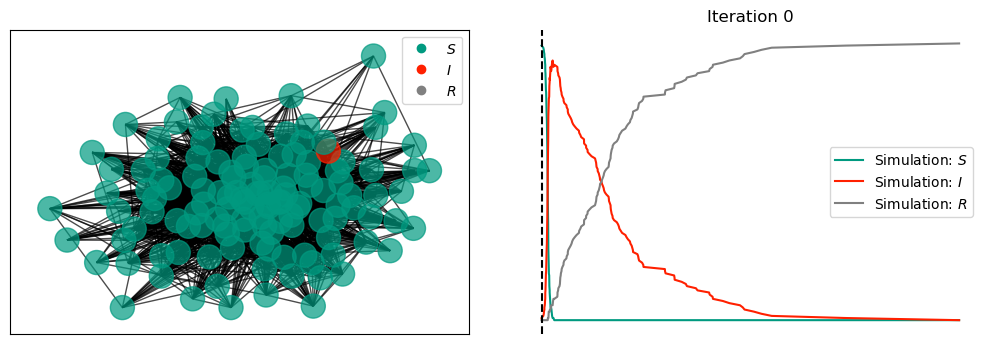

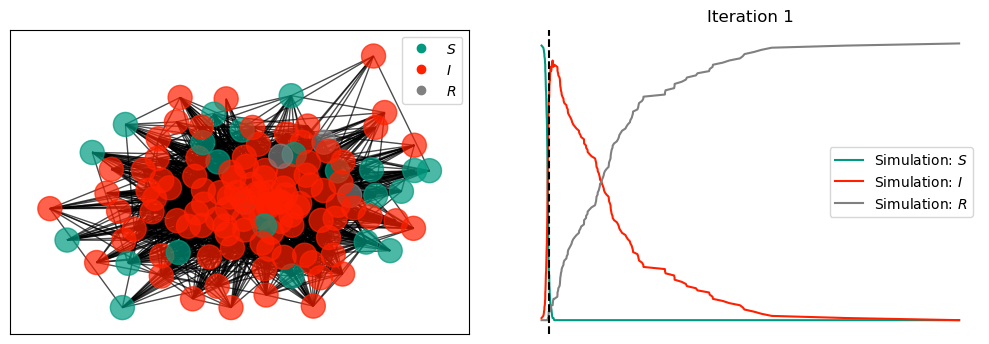

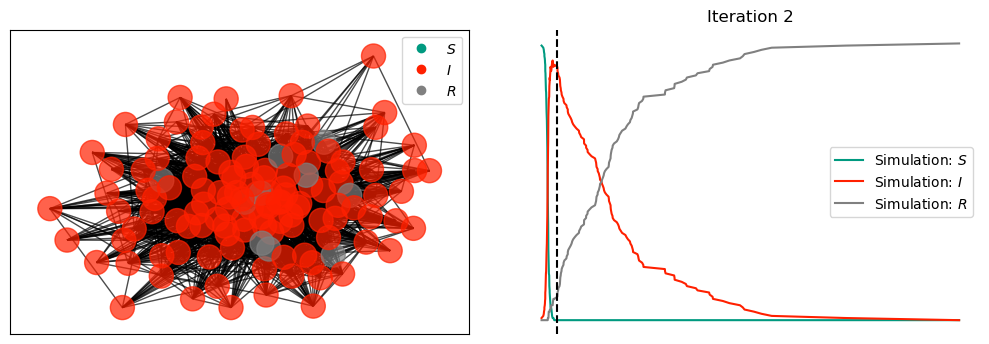

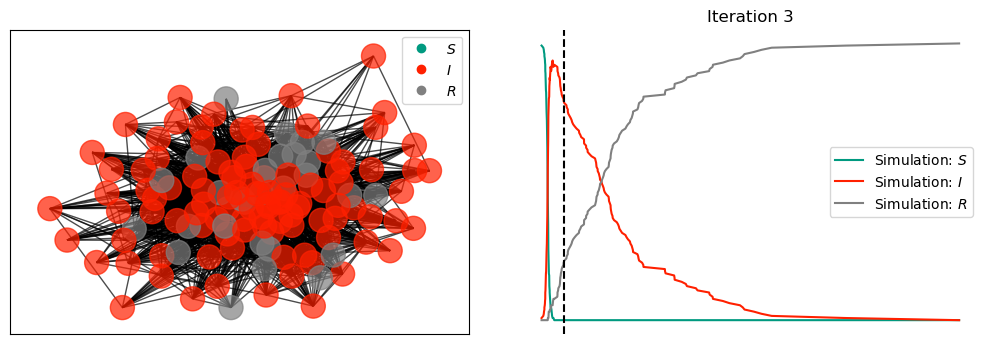

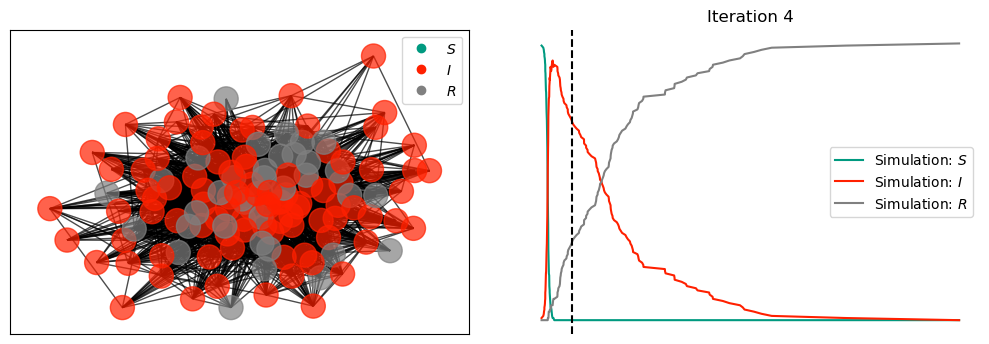

...

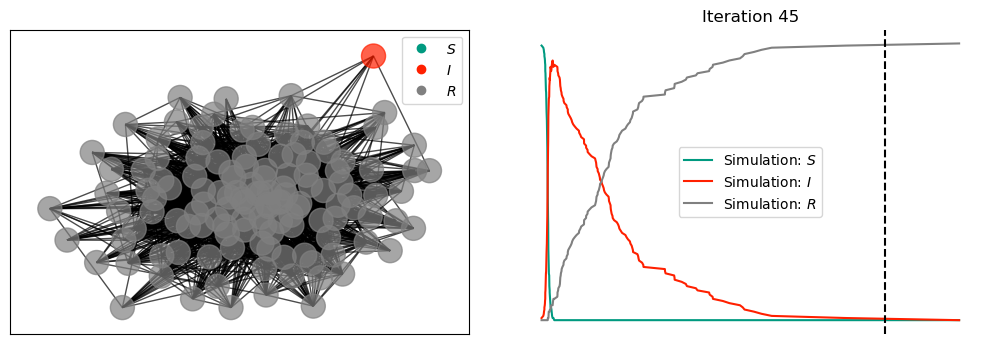

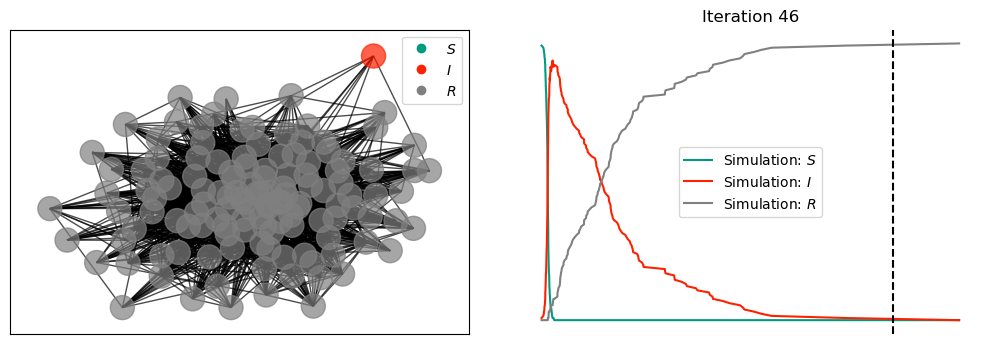

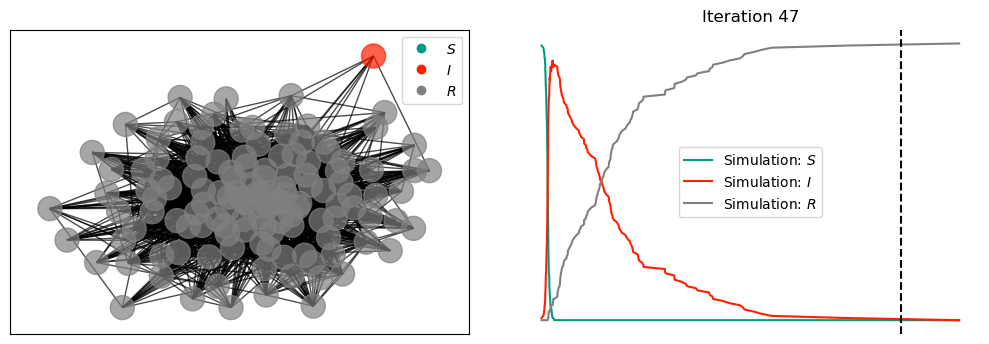

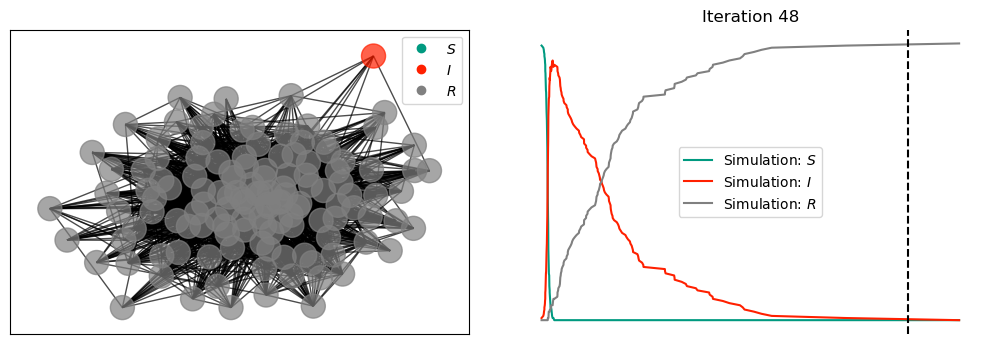

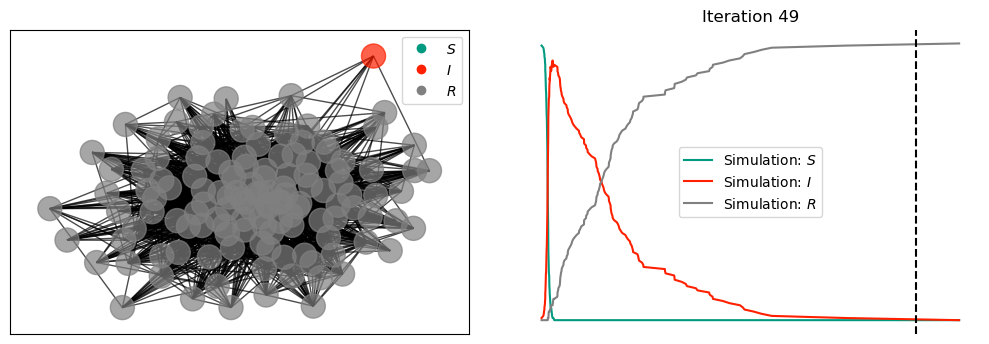

In [29]:
#git link : https://python.plainenglish.io/visualizing-dynamic-phenomena-with-sir-model-and-networks-45a4e629e609
import EoN

gamma = 0.125  
beta = 0.1693

r_0 = beta/gamma
print(r_0)
N = 100 # population size
I0 = 1   # intial n° of infected individuals 
R0 = 0
S0 = N - I0 -R0
pos = nx.spring_layout(G)
edgewidth = [d['weight'] for (u,v,d) in G.edges(data=True)]
nx_kwargs = {"pos": pos, "alpha": 0.7} #optional arguments to be passed on to the



print("Doing Gillespie simulation")
sim = EoN.Gillespie_SIR(G, tau = beta, gamma=gamma, rho = I0/N, return_full_data=True)
#network_ax, timeseries_axes = sim.display(time=1)
print("Done with simulation, now plotting")


for i in range(0,50,1):
    fig = sim.display(time = i, ts_plots=["SIR"],**nx_kwargs)
    plt.axis('off')
    plt.title("Iteration {}".format(i))
    plt.draw()
    plt.savefig('./gif/'+str(i) +'.png')

MovieWriter mencoder unavailable; using Pillow instead.


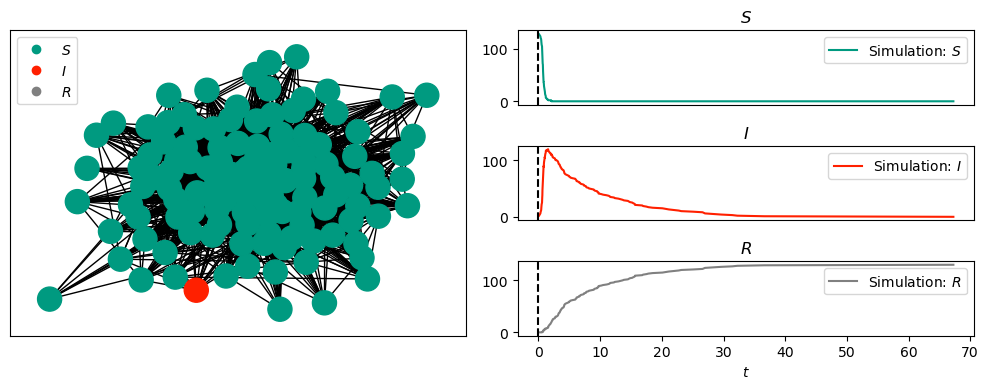

In [25]:
import matplotlib.animation as animation
anim = sim.animate()
anim.save('the_movie.gif', writer = 'mencoder', fps=15)